# 27 -- Figures and audit for the standardised chain (PLMS)

Inference only. Loads the standardised checkpoint from `19`, evaluates it
with **PLMS** (the sampler used for the master table, see `24`/`26`) and
regenerates every Chapter-4 figure from that model so figures and tables
describe the same run:

* predicted vs ground-truth standard-deviation scatter
* reconstruction grid (6 patches)
* success / failure panel
* metric violins
* uncertainty map + spread--error correlation (40 patches x 5 samples)

It also **audits the preprocessing for leakage**: rebuilds the split, checks
zero R-tree overlap, recomputes the standardisation statistics from the
training ids and confirms they match the file `19` saved (so no validation
pixel influenced the scaling). Outputs carry the tag `_standardised_plms_`.

For the morphological / statistical patch figure, run `pcrtc/22` with
`CKPT_PATH` pointed at the standardised checkpoint and `sampler = p_sample_loop_plms`.

## GPU configuration

In [13]:
import os
import sys
import json
import random
from pathlib import Path

import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import rasterio

assert torch.cuda.is_available(), 'CUDA is required. Run this notebook on the GPU environment.'
DEVICE = torch.device('cuda')
torch.backends.cudnn.benchmark = True
print('GPU:', torch.cuda.get_device_name(0))

GPU: NVIDIA GeForce RTX 4090


## Paths and training configuration

In [14]:
WORKING_REPO = Path('/cs/student/project_msc/2025/aibh/jiayiche')
TESSA_REPO = Path('/cs/student/project_msc/2025/aibh/jiayiche/tessa_baseline')
REGION = 'tuk'
LIDAR_DIR = WORKING_REPO / 'input_data' / 'lidar_patches_tuk_tessa'
S1_DIR = WORKING_REPO / 'input_data' / 's1_patches_tuk_pcrtc'
CHECKPOINT_DIR = WORKING_REPO / 'checkpoints'
OUTPUT_DIR = WORKING_REPO / 's1_training_outputs'
CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
CONTEXT_K = 3
TARGET_HW = (256, 256)
BATCH_SIZE = 8
EPOCHS = 100
TIMESTEPS = 1000
LEARNING_RATE = 1e-4
VAL_FRACTION = 0.15
SEED = 42
NOISE_SCHEDULE = 'linear'
ATTENTION_VARIANT = 'default'
LIDAR_SURVEY_DATE = __import__('datetime').date(2024, 4, 16)

# Spatial-block split parameters -- see the split cell below for reasoning
BLOCK_SIZE_M = 1024.0  # 4x the ~256m patch size, generous margin
BUFFER_M = 150.0       # patches within this of a block boundary are dropped entirely

# ---- the only experimental change in this notebook -------------------
STANDARDISE = True
# Distinct names so 09's checkpoint and metrics (including the three
# seed-variance runs) survive this notebook untouched.
RUN_TAG = 'pcrtc_realattrs_spatialsplit_standardised'
CKPT_PATH = CHECKPOINT_DIR / f's1_{REGION}_{RUN_TAG}_unet_best.pth'
METRICS_PATH = OUTPUT_DIR / f's1_{RUN_TAG}_validation_metrics.json'
STATS_PATH = OUTPUT_DIR / f's1_{RUN_TAG}_norm_stats.json'
assert CKPT_PATH.exists(), f'{CKPT_PATH} missing -- run 19 first'
FIG_TAG = 'pcrtc_realattrs_spatialsplit_standardised_plms'
METRICS_PATH = OUTPUT_DIR / f's1_{FIG_TAG}_validation_metrics.json'   # 24 wrote s1_pcrtc_standardised_spatialsplit_plms_...; this is a re-draw with figures

## Import Tessa's baseline implementation

In [15]:
sys.path.insert(0, str(TESSA_REPO))
from src.model.unet import ConditionalUNet
from src.diffusion.scheduler import LinearDiffusionScheduler, CosineDiffusionScheduler
from src.diffusion.sampling import p_sample_loop_ddpm, p_sample_loop_ddim, p_sample_loop_plms
from src.utils.recon_metrics import rmse, bias, sigma_error, normal_angle_error, average_jsd_multiscale, log_psd_rmse, zncc

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)

## Sentinel-1/LiDAR dataset adapter -- repeated channels, real attrs (unchanged from 06)

In [16]:
def build_real_attrs(s1_path, times, context_k):
    attrs_path = s1_path / 'attrs.json'
    attrs_list = json.load(open(attrs_path)) if attrs_path.exists() else []
    vecs = []
    for time_path in times:
        idx = int(time_path.stem[1:])  # 't0' -> 0
        a = attrs_list[idx] if idx < len(attrs_list) else {}
        if a.get('acquisition_date'):
            import datetime as dt
            acq_date = dt.date.fromisoformat(a['acquisition_date'])
            age_days = (acq_date - LIDAR_SURVEY_DATE).days
            age_norm = age_days / 30.0
        else:
            age_norm = 0.0
        orbit_dir = 1.0 if a.get('orbit_direction') == 'ASCENDING' else 0.0
        rel_orbit = (a.get('relative_orbit_number') or 0) / 175.0
        vecs.append([age_norm, orbit_dir, rel_orbit, 0.0, 0.0, 0.0, 0.0, 0.0])
    return torch.tensor(vecs, dtype=torch.float32).flatten()


def load_sar_db(time_path):
    """Native-resolution VV/VH in dB. Shared by the statistics pass and the
    dataset, so the numbers the statistics describe are the numbers the model
    sees -- there is no second, slightly different code path."""
    with rasterio.open(time_path) as src:
        sar = src.read()[:2].astype(np.float32)
    sar = np.nan_to_num(sar, nan=0.0, posinf=0.0, neginf=0.0)
    sar = np.maximum(sar, 1e-12)
    return 10.0 * np.log10(sar)


class LidarS1Dataset(Dataset):
    def __init__(self, s1_dir, lidar_dir, patch_ids, context_k=3, target_hw=(256, 256),
                 train=False, norm_stats=None):
        self.s1_dir = Path(s1_dir)
        self.lidar_dir = Path(lidar_dir)
        self.patch_ids = list(patch_ids)
        self.context_k = context_k
        self.target_hw = target_hw
        self.train = train
        # norm_stats is (mean, std), each shape (2,) for VV and VH.
        # None reproduces 09 exactly.
        self.norm_stats = norm_stats

    def __len__(self):
        return len(self.patch_ids)

    def __getitem__(self, index):
        patch_id = self.patch_ids[index]
        lidar_path = self.lidar_dir / f'lidar_patch_{patch_id}.tif'
        s1_path = self.s1_dir / f's1_patch_{patch_id}'
        with rasterio.open(lidar_path) as src:
            raw = src.read().astype(np.float32)
        target = raw[0]
        mask = (raw[1] > 0.5) if raw.shape[0] > 1 else np.isfinite(target)
        target = np.nan_to_num(target, nan=0.0, posinf=0.0, neginf=0.0)
        valid_count = max(1, int(mask.sum()))
        patch_mean = float(target[mask].sum() / valid_count)
        target = (target - patch_mean) * mask

        times = sorted(s1_path.glob('t*.tif'))[:self.context_k]
        if len(times) < self.context_k:
            raise RuntimeError(f'{s1_path} has fewer than {self.context_k} Sentinel-1 times')
        views = []
        for time_path in times:
            sar = load_sar_db(time_path)
            if self.norm_stats is not None:
                mean, std = self.norm_stats
                sar = (sar - mean[:, None, None]) / std[:, None, None]
            sar_tensor = torch.from_numpy(sar).unsqueeze(0)
            sar_tensor = F.interpolate(sar_tensor, size=self.target_hw, mode='bilinear', align_corners=False).squeeze(0)
            sar_tensor = sar_tensor.repeat(2, 1, 1)
            views.append(sar_tensor)
        condition = torch.cat(views, dim=0)
        attrs = build_real_attrs(s1_path, times, self.context_k)
        return {'lidar': torch.from_numpy(target).unsqueeze(0).float(), 'mask': torch.from_numpy(mask), 's1': condition.float(), 'attrs': attrs, 'patch_mean': torch.tensor(patch_mean), 'patch_id': patch_id}

## Spatial-block split (corrected)

Groups patches into `BLOCK_SIZE_M`-sized geographic blocks by centroid,
shuffles and assigns whole blocks to train/val (never splitting a block),
and drops any patch within `BUFFER_M` of a block boundary entirely --
guaranteeing no train patch and val patch can be adjacent across a block
edge, regardless of how dense the original patch overlap was.

In [17]:
lidar_ids = {p.stem.split('_')[-1] for p in LIDAR_DIR.glob('lidar_patch_*.tif')}
s1_ids = {p.name.split('_')[-1] for p in S1_DIR.glob('s1_patch_*') if p.is_dir()}
paired_ids = sorted(lidar_ids & s1_ids)
assert paired_ids, 'No paired Sentinel-1/LiDAR patches found.'

def patch_centroid(patch_id):
    with rasterio.open(LIDAR_DIR / f'lidar_patch_{patch_id}.tif') as src:
        b = src.bounds
    return ((b.left + b.right) / 2.0, (b.bottom + b.top) / 2.0)

centroids = {pid: patch_centroid(pid) for pid in paired_ids}

def block_id_and_boundary_distance(cx, cy, block_size):
    bx, by = int(cx // block_size), int(cy // block_size)
    dx = min(cx - bx * block_size, (bx + 1) * block_size - cx)
    dy = min(cy - by * block_size, (by + 1) * block_size - cy)
    return (bx, by), min(dx, dy)

blocks = {}
dropped_buffer = []
for pid, (cx, cy) in centroids.items():
    bid, boundary_dist = block_id_and_boundary_distance(cx, cy, BLOCK_SIZE_M)
    if boundary_dist < BUFFER_M:
        dropped_buffer.append(pid)
        continue
    blocks.setdefault(bid, []).append(pid)

kept_total = sum(len(v) for v in blocks.values())
print(f'{len(dropped_buffer)} / {len(paired_ids)} patches dropped as boundary buffer')
print(f'{len(blocks)} spatial blocks remain, containing {kept_total} patches')

block_ids = list(blocks.keys())
random.Random(SEED).shuffle(block_ids)

target_val_patches = int(len(paired_ids) * VAL_FRACTION)  # same target fraction as 06, for comparability
val_ids, train_ids = [], []
running_val_count = 0
for bid in block_ids:
    if running_val_count < target_val_patches:
        val_ids.extend(blocks[bid])
        running_val_count += len(blocks[bid])
    else:
        train_ids.extend(blocks[bid])

print(f'Spatial-block split: train={len(train_ids)}, val={len(val_ids)} '
      f'(target val={target_val_patches}, {len(dropped_buffer)} dropped as buffer)')

# Datasets are built in the next cell instead, because they need the
# normalisation statistics and those can only be computed once train_ids
# exists.

887 / 1676 patches dropped as boundary buffer
43 spatial blocks remain, containing 789 patches
Spatial-block split: train=534, val=255 (target val=251, 887 dropped as buffer)


### Verify the split is actually leakage-free

Reuses `pcrtc/08`'s spatial-overlap check directly, applied to this new
split. **This must print `0 / N` before continuing** -- the assertion
below will stop the notebook otherwise, rather than silently training on
a still-contaminated split. If it fails, increase `BLOCK_SIZE_M` or
`BUFFER_M` above and re-run from the split cell.

In [18]:
from shapely.geometry import box
from shapely.strtree import STRtree

train_boxes = []
for pid in train_ids:
    with rasterio.open(LIDAR_DIR / f'lidar_patch_{pid}.tif') as src:
        train_boxes.append(box(*src.bounds))

val_boxes = []
for pid in val_ids:
    with rasterio.open(LIDAR_DIR / f'lidar_patch_{pid}.tif') as src:
        val_boxes.append((pid, box(*src.bounds)))

tree = STRtree(train_boxes)
overlap_count = 0
for pid, vbox in val_boxes:
    hits = tree.query(vbox)
    real_overlaps = [h for h in hits if train_boxes[h].intersects(vbox) and not train_boxes[h].touches(vbox)]
    if real_overlaps:
        overlap_count += 1
        print(f'Val patch {pid} still overlaps {len(real_overlaps)} training patch(es)')

print(f'\n{overlap_count} / {len(val_ids)} validation patches overlap a training patch (must be 0)')
assert overlap_count == 0, (
    'Spatial-block split still has leakage -- increase BLOCK_SIZE_M or BUFFER_M '
    'in the config cell above and re-run from the split cell.'
)
print('Confirmed: spatial-block split is leakage-free. Safe to proceed to training.')

split_check_result = {'n_train': len(train_ids), 'n_val': len(val_ids),
                       'n_dropped_buffer': len(dropped_buffer), 'n_overlaps_found': overlap_count,
                       'block_size_m': BLOCK_SIZE_M, 'buffer_m': BUFFER_M}
with (OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_split_check.json').open('w') as f:
    json.dump(split_check_result, f, indent=2)
print('Saved:', OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_split_check.json')


0 / 255 validation patches overlap a training patch (must be 0)
Confirmed: spatial-block split is leakage-free. Safe to proceed to training.
Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_split_check.json


### How much margin, not just pass/fail

The assertion above confirms zero overlap, but that alone doesn't say
whether the split is comfortably clean or just barely passing. This
computes the actual distance from every validation patch to its nearest
training patch -- a healthy result clusters well above `0`, consistent
with `BUFFER_M`; anything close to `0` would mean patches are touching
edge-to-edge with no real separation, worth tightening the buffer for.

In [19]:
nearest_distances = []
for pid, vbox in val_boxes:
    min_dist = min(vbox.distance(tbox) for tbox in train_boxes)
    nearest_distances.append((pid, min_dist))

nearest_distances_arr = np.array([d for _, d in nearest_distances])
print(f'Distance from each validation patch to its nearest training patch:')
print(f'  min:    {nearest_distances_arr.min():.1f} m')
print(f'  median: {np.median(nearest_distances_arr):.1f} m')
print(f'  mean:   {nearest_distances_arr.mean():.1f} m')
print(f'  max:    {nearest_distances_arr.max():.1f} m')

closest_pid, closest_dist = min(nearest_distances, key=lambda x: x[1])
print(f'\nClosest pair overall: val patch {closest_pid} is {closest_dist:.1f} m from its nearest training patch')
print(f'(buffer was configured at {BUFFER_M} m per side, {2 * BUFFER_M} m total dead zone)')

margin_result = {
    'min_distance_m': float(nearest_distances_arr.min()),
    'median_distance_m': float(np.median(nearest_distances_arr)),
    'mean_distance_m': float(nearest_distances_arr.mean()),
    'max_distance_m': float(nearest_distances_arr.max()),
    'buffer_m_configured': BUFFER_M,
}
with (OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_margin_check.json').open('w') as f:
    json.dump(margin_result, f, indent=2)
print('\nSaved:', OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_margin_check.json')

Distance from each validation patch to its nearest training patch:
  min:    128.0 m
  median: 384.0 m
  mean:   367.6 m
  max:    819.6 m

Closest pair overall: val patch 12340 is 128.0 m from its nearest training patch
(buffer was configured at 150.0 m per side, 300.0 m total dead zone)

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_margin_check.json


## Standardisation statistics: recompute from the training split and compare with the saved file

In [20]:
# Per-channel statistics from the TRAINING SPLIT ONLY.
#
# Computed on dB values at native 26x26 resolution, before upsampling.
# Upsampling is a weighted average of neighbours, so it shrinks the variance
# without changing what the data is; taking statistics before it keeps them a
# property of the measurement rather than of the resampling. It is also ~100x
# cheaper.
#
# Nothing here reads val_ids. That is what makes this leakage-free, and it is
# asserted rather than asserted-in-prose.
if True:
    assert not (set(train_ids) & set(val_ids)), 'train and val ids overlap'
    sums = np.zeros(2, dtype=np.float64)
    sqs = np.zeros(2, dtype=np.float64)
    count = 0
    for pid in train_ids:
        s1_path = S1_DIR / f's1_patch_{pid}'
        for time_path in sorted(s1_path.glob('t*.tif'))[:CONTEXT_K]:
            sar = load_sar_db(time_path)          # (2, h, w)
            sums += sar.reshape(2, -1).sum(axis=1)
            sqs += (sar.reshape(2, -1) ** 2).sum(axis=1)
            count += sar.shape[1] * sar.shape[2]
    mean = sums / count
    var = np.maximum(sqs / count - mean ** 2, 1e-12)
    std = np.sqrt(var)
    NORM_STATS = (mean.astype(np.float32), std.astype(np.float32))
    print(f'Statistics over {len(train_ids)} training patches x {CONTEXT_K} views '
          f'= {count:,} pixels per channel')
    print(f'  VV  mean {mean[0]:8.3f} dB   std {std[0]:6.3f} dB')
    print(f'  VH  mean {mean[1]:8.3f} dB   std {std[1]:6.3f} dB')
    json.dump({'mean': mean.tolist(), 'std': std.tolist(),
               'n_train_patches': len(train_ids), 'n_pixels_per_channel': int(count)},
              STATS_PATH.open('w'), indent=2)
    print('Saved:', STATS_PATH)
else:
    NORM_STATS = None
    print('STANDARDISE is False -- this run reproduces 09 exactly.')

train_dataset = LidarS1Dataset(S1_DIR, LIDAR_DIR, train_ids, CONTEXT_K, TARGET_HW, train=True, norm_stats=NORM_STATS)
val_dataset = LidarS1Dataset(S1_DIR, LIDAR_DIR, val_ids, CONTEXT_K, TARGET_HW, train=False, norm_stats=NORM_STATS)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

# Sanity check: a training batch should now be near zero mean, unit variance.
_b = next(iter(train_loader))['s1']
print(f'\nFirst training batch, conditioning tensor {tuple(_b.shape)}: '
      f'mean {_b.mean():+.3f}, std {_b.std():.3f}')
if STANDARDISE and not (abs(_b.mean()) < 0.5 and 0.5 < _b.std() < 2.0):
    print('  WARNING: batch statistics are not close to (0, 1). Check the stats pass '
          'before spending GPU time on this run.')

saved = json.load(open(STATS_PATH))
sm, ss = np.array(saved['mean']), np.array(saved['std'])
print('saved by 19 :', sm.round(4), ss.round(4))
print('recomputed  :', mean.round(4), std.round(4))
assert np.allclose(sm, mean, atol=1e-3) and np.allclose(ss, std, atol=1e-3), 'saved statistics do not match the training split'
print('PREPROCESSING AUDIT: zero train/val overlap; statistics reproduce from training ids only -- no validation pixel enters the scaling.')
NORM_STATS = (sm.astype(np.float32), ss.astype(np.float32))
val_dataset = LidarS1Dataset(S1_DIR, LIDAR_DIR, val_ids, context_k=CONTEXT_K, target_hw=TARGET_HW, train=False, norm_stats=NORM_STATS)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

Statistics over 534 training patches x 3 views = 1,082,952 pixels per channel
  VV  mean  -18.173 dB   std  2.561 dB
  VH  mean  -24.004 dB   std  2.604 dB
Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_norm_stats.json

First training batch, conditioning tensor (8, 12, 256, 256): mean +0.123, std 0.961
saved by 19 : [-18.1734 -24.0038] [2.561  2.6044]
recomputed  : [-18.1734 -24.0038] [2.561  2.6044]
PREPROCESSING AUDIT: zero train/val overlap; statistics reproduce from training ids only -- no validation pixel enters the scaling.


## Load the standardised checkpoint

In [21]:
model = ConditionalUNet(in_channels=1, cond_channels=4 * CONTEXT_K, attr_dim=8 * CONTEXT_K, base_channels=128, embed_dim=256, unet_depth=4, attention_variant=ATTENTION_VARIANT, cond_k=CONTEXT_K).to(DEVICE)
scheduler = (LinearDiffusionScheduler(TIMESTEPS, device=DEVICE) if NOISE_SCHEDULE == 'linear' else CosineDiffusionScheduler(TIMESTEPS, device=DEVICE))
print('Trainable parameters:', sum(p.numel() for p in model.parameters() if p.requires_grad))
ckpt = torch.load(CKPT_PATH, map_location=DEVICE); model.load_state_dict(ckpt['model_state_dict']); model.eval()
print('loaded', CKPT_PATH.name, '| epoch', ckpt.get('epoch'), '| val_loss', ckpt.get('val_loss'))

Trainable parameters: 104625307
loaded s1_tuk_pcrtc_realattrs_spatialsplit_standardised_unet_best.pth | epoch 79 | val_loss 0.01299282857507933


## Evaluate with PLMS

In [10]:
seed_everything(SEED)
sampler = p_sample_loop_plms
metric_rows = []
example_patches = []  # keep a few full patches for the qualitative reconstruction grid
N_EXAMPLES = 6
with torch.no_grad():
    for batch in val_loader:
        target = batch['lidar'].to(DEVICE)
        condition = batch['s1'].to(DEVICE)
        attrs = batch['attrs'].to(DEVICE)
        mask = batch['mask'].to(DEVICE).bool()
        prediction = sampler(model, scheduler, target.shape, condition, attrs, DEVICE)
        means = batch['patch_mean'].to(DEVICE).view(-1, 1, 1, 1)
        gt_absolute = target + means
        pred_absolute = prediction + means
        for i, patch_id in enumerate(batch['patch_id']):
            gt_i, pred_i, mask_i = gt_absolute[i], pred_absolute[i], mask[i]
            gt_valid = gt_i.squeeze()[mask_i].cpu().numpy()
            pred_valid = pred_i.squeeze()[mask_i].cpu().numpy()
            row = {
                'patch_id': patch_id,
                'rmse_m': float(rmse(gt_i, pred_i, mask_i).item()),
                'bias_m': float(bias(gt_i, pred_i, mask_i).item()),
                'sigma_error_pct': float(sigma_error(gt_i, pred_i, mask_i).item()),
                'normal_angle_error_deg': float(normal_angle_error(gt_i, pred_i, mask_i, pixel_size=1.0, degrees=True).item()),
                'jsd': float(average_jsd_multiscale(gt_i, pred_i, pixel_size=1.0, mask=mask_i).item()),
                'psd_rmse': float(log_psd_rmse(gt_i, pred_i, pixel_size=1.0, mask=mask_i).item()),
                'zncc': float(zncc(gt_i, pred_i, mask_i).item()),
                'gt_std_val': float(gt_valid.std()) if gt_valid.size > 0 else float('nan'),
                'pred_std_val': float(pred_valid.std()) if pred_valid.size > 0 else float('nan'),
            }
            metric_rows.append(row)
            if len(example_patches) < N_EXAMPLES:
                example_patches.append({
                    'patch_id': patch_id,
                    'gt': gt_i.squeeze().cpu().numpy(),
                    'pred': pred_i.squeeze().cpu().numpy(),
                    'mask': mask_i.squeeze().cpu().numpy(),
                    's1_condition': condition[i].cpu().numpy(),
                })
metrics_path = METRICS_PATH
with metrics_path.open('w') as handle:
    json.dump(metric_rows, handle, indent=2)
print('Saved:', metrics_path)
print('Mean metrics:', {key: float(np.nanmean([row[key] for row in metric_rows])) for key in metric_rows[0] if key != 'patch_id'})

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_plms_validation_metrics.json
Mean metrics: {'rmse_m': 0.16316442981946702, 'bias_m': -0.011820807267669771, 'sigma_error_pct': 37.80838802749035, 'normal_angle_error_deg': 1.6906270368426455, 'jsd': 0.1328460568890852, 'psd_rmse': 1.9659641513637467, 'zncc': 0.37003233439709043, 'gt_std_val': 0.17209622516643766, 'pred_std_val': 0.10560851280449653}


Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_plms_gt_pred_std_scatter.png


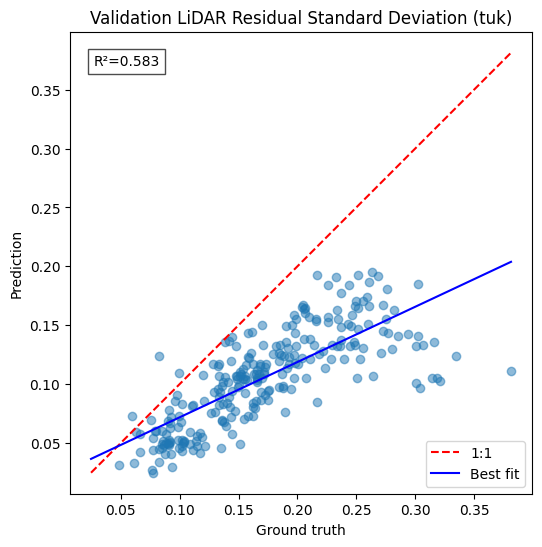

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

df_val = pd.DataFrame(metric_rows)

x = df_val['gt_std_val']
y = df_val['pred_std_val']

plt.figure(figsize=(6, 6))
plt.scatter(x, y, alpha=0.5)

mn, mx = np.nanmin([x, y]), np.nanmax([x, y])
plt.plot([mn, mx], [mn, mx], 'r--', label='1:1')

mask = ~np.isnan(x) & ~np.isnan(y)
z = np.polyfit(x[mask], y[mask], 1)
p = np.poly1d(z)
xs = np.array([mn, mx])
plt.plot(xs, p(xs), 'b-', label='Best fit')

r2 = np.corrcoef(x[mask], y[mask])[0, 1] ** 2
plt.text(0.05, 0.95, f'R²={r2:.3f}', transform=plt.gca().transAxes, va='top', bbox=dict(facecolor='white', alpha=0.7))

plt.xlabel('Ground truth')
plt.ylabel('Prediction')
plt.title(f'Validation LiDAR Residual Standard Deviation ({REGION})')
plt.legend()
plt.gca().set_aspect('equal', adjustable='box')
plt.savefig(OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_gt_pred_std_scatter.png', dpi=150, bbox_inches='tight')
print('Saved:', OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_gt_pred_std_scatter.png')
plt.show()

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_plms_reconstructions_pdfs.png


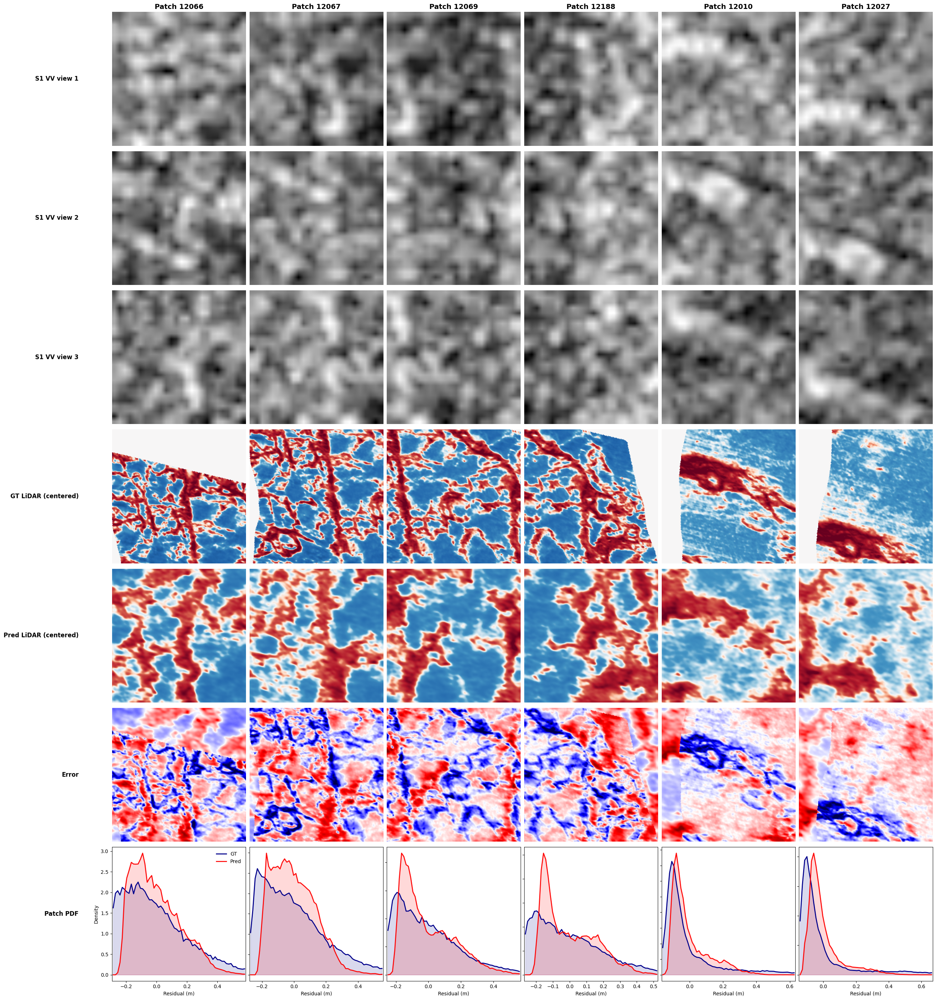

In [12]:
from matplotlib.colors import SymLogNorm

n_show = min(6, len(example_patches))
num_context_rows = CONTEXT_K
num_data_rows = 4
total_rows = num_context_rows + num_data_rows
num_cols = n_show

centered_gt = []
centered_pred = []
for p in example_patches[:n_show]:
    gt_mean = p['gt'][p['mask']].mean()
    pred_mean = p['pred'][p['mask']].mean()
    centered_gt.append(p['gt'] - gt_mean)
    centered_pred.append(p['pred'] - pred_mean)

all_gt = np.stack(centered_gt)
all_pred = np.stack(centered_pred)
max_abs_resid = np.quantile(np.abs(np.concatenate([all_gt.ravel(), all_pred.ravel()])), 0.995)
signed_error = all_pred - all_gt
max_abs_error = np.quantile(np.abs(signed_error.ravel()), 0.995)
norm = SymLogNorm(linthresh=0.1, linscale=1.0, vmin=-max_abs_resid, vmax=max_abs_resid, base=10)

row_titles = [f'S1 VV view {k + 1}' for k in range(CONTEXT_K)] + ['GT LiDAR (centered)', 'Pred LiDAR (centered)', 'Error', 'Patch PDF']

tile_size_inches = 4.0
fig, axes = plt.subplots(total_rows, num_cols, figsize=(num_cols * tile_size_inches + 2, total_rows * tile_size_inches), squeeze=False)

for col in range(num_cols):
    p = example_patches[col]
    gt_i, pred_i, mask_i = centered_gt[col], centered_pred[col], p['mask']
    s1_cond = p['s1_condition']

    axes[0, col].set_title(f"Patch {p['patch_id']}", fontsize=14, fontweight='bold')

    for k in range(CONTEXT_K):
        ax = axes[k, col]
        ax.imshow(s1_cond[k * 4], cmap='gray')
        ax.axis('off')

    row_gt = num_context_rows
    ax = axes[row_gt, col]
    im_gt = ax.imshow(gt_i, cmap='RdBu_r', norm=norm)
    ax.axis('off')

    row_pred = num_context_rows + 1
    ax = axes[row_pred, col]
    im_pred = ax.imshow(pred_i, cmap='RdBu_r', norm=norm)
    ax.axis('off')

    row_err = num_context_rows + 2
    err_i = pred_i - gt_i
    ax = axes[row_err, col]
    im_err = ax.imshow(err_i, cmap='seismic', vmin=-max_abs_error, vmax=max_abs_error)
    ax.axis('off')

    row_pdf = num_context_rows + 3
    ax = axes[row_pdf, col]
    gt_vals = gt_i[mask_i]
    pred_vals = pred_i[mask_i]
    if gt_vals.size > 1 and pred_vals.size > 1:
        all_vals = np.concatenate([gt_vals, pred_vals])
        vmin_pdf, vmax_pdf = np.quantile(all_vals, [0.01, 0.99])
        if np.isclose(vmin_pdf, vmax_pdf):
            vmin_pdf, vmax_pdf = all_vals.min(), all_vals.max()
        bins = np.linspace(vmin_pdf, vmax_pdf, 60)
        gt_pdf, edges = np.histogram(gt_vals, bins=bins, density=True)
        pred_pdf, _ = np.histogram(pred_vals, bins=bins, density=True)
        centers = 0.5 * (edges[:-1] + edges[1:])
        ax.plot(centers, gt_pdf, color='darkblue', lw=2, label='GT')
        ax.plot(centers, pred_pdf, color='red', lw=2, alpha=0.95, label='Pred')
        ax.fill_between(centers, gt_pdf, color='darkblue', alpha=0.15)
        ax.fill_between(centers, pred_pdf, color='red', alpha=0.15)
        ax.set_xlim(vmin_pdf, vmax_pdf)
    ax.set_xlabel('Residual (m)', fontsize=10)
    if col == 0:
        ax.set_ylabel('Density', fontsize=10)
        ax.legend(fontsize=10, frameon=False)
    else:
        ax.set_yticklabels([])
    ax.set_box_aspect(1)

for row in range(total_rows):
    axes[row, 0].text(-0.25, 0.5, row_titles[row], ha='right', va='center', transform=axes[row, 0].transAxes, fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_reconstructions_pdfs.png', dpi=200, bbox_inches='tight')
print('Saved:', OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_reconstructions_pdfs.png')
plt.show()

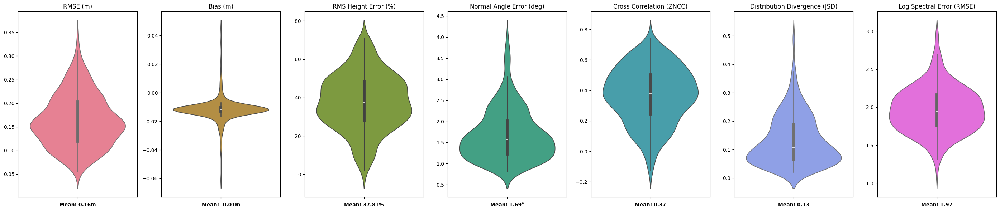

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_plms_metric_violin_plots.png


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

if 'df_val' not in dir():
    df_val = pd.DataFrame(metric_rows)

metrics_to_plot = [
    ('rmse_m', 'RMSE (m)', 'm'),
    ('bias_m', 'Bias (m)', 'm'),
    ('sigma_error_pct', 'RMS Height Error (%)', '%'),
    ('normal_angle_error_deg', 'Normal Angle Error (deg)', '°'),
    ('zncc', 'Cross Correlation (ZNCC)', ''),
    ('jsd', 'Distribution Divergence (JSD)', ''),
    ('psd_rmse', 'Log Spectral Error (RMSE)', ''),
]

fig, axes = plt.subplots(1, len(metrics_to_plot), figsize=(4 * len(metrics_to_plot), 6))
colors = sns.color_palette('husl', len(metrics_to_plot))

for ax, (key, title, unit), color in zip(axes, metrics_to_plot, colors):
    values = df_val[key].dropna()
    sns.violinplot(y=values, ax=ax, color=color, inner='box')
    ax.set_title(title)
    ax.set_ylabel('')
    mean_val = values.mean()
    ax.set_xlabel(f'Mean: {mean_val:.2f}{unit}', fontsize=10, fontweight='bold')

plt.tight_layout()
out_path = OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_metric_violin_plots.png'
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print('Saved:', out_path)

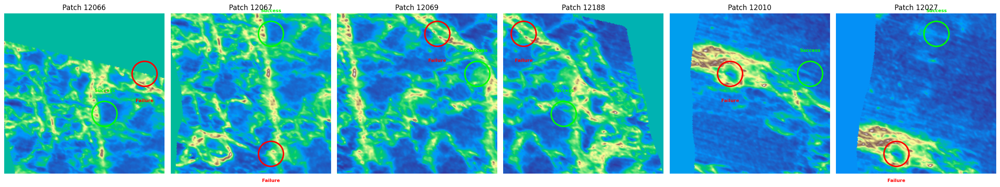

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_pcrtc_realattrs_spatialsplit_standardised_plms_success_failure.png


In [14]:
import matplotlib.pyplot as plt
import numpy as np

def find_success_failure_regions(gt, pred, mask, block_size=64):
    """Split the patch into blocks; success = textured block with lowest error,
    failure = textured block with highest error. 'Textured' excludes flat/boring
    background blocks so the comparison is about real roughness, not empty ice."""
    error = np.abs(pred - gt)
    h, w = gt.shape
    block_stats = []
    for i in range(h // block_size):
        for j in range(w // block_size):
            r0, r1 = i * block_size, (i + 1) * block_size
            c0, c1 = j * block_size, (j + 1) * block_size
            block_mask = mask[r0:r1, c0:c1]
            if block_mask.sum() < 0.5 * block_mask.size:
                continue  # skip mostly-invalid blocks
            block_stats.append({
                'row': r0 + block_size // 2, 'col': c0 + block_size // 2,
                'gt_std': gt[r0:r1, c0:c1][block_mask].std(),
                'error': error[r0:r1, c0:c1][block_mask].mean(),
            })
    if not block_stats:
        return None, None
    median_std = np.median([b['gt_std'] for b in block_stats])
    textured = [b for b in block_stats if b['gt_std'] >= median_std] or block_stats
    success = min(textured, key=lambda b: b['error'])
    failure = max(textured, key=lambda b: b['error'])
    return success, failure


n_show = min(6, len(example_patches))
fig, axes = plt.subplots(1, n_show, figsize=(4 * n_show, 4.5))
if n_show == 1:
    axes = [axes]

for ax, patch in zip(axes, example_patches[:n_show]):
    gt, pred, mask = patch['gt'], patch['pred'], patch['mask']
    gt_display = gt - gt[mask].mean()  # recenter for display only, avoids the saturated-color bug from before

    ax.imshow(gt_display, cmap='terrain')
    ax.set_title(f"Patch {patch['patch_id']}")
    ax.axis('off')

    success, failure = find_success_failure_regions(gt, pred, mask)
    if success is not None:
        ax.add_patch(plt.Circle((success['col'], success['row']), 20, edgecolor='lime', facecolor='none', linewidth=2.5))
        ax.annotate('Success', (success['col'], success['row']), color='lime', fontsize=8, fontweight='bold',
                    xytext=(success['col'], success['row'] - 35), ha='center')
    if failure is not None:
        ax.add_patch(plt.Circle((failure['col'], failure['row']), 20, edgecolor='red', facecolor='none', linewidth=2.5))
        ax.annotate('Failure', (failure['col'], failure['row']), color='red', fontsize=8, fontweight='bold',
                    xytext=(failure['col'], failure['row'] + 45), ha='center')

plt.tight_layout()
out_path = OUTPUT_DIR / 's1_pcrtc_realattrs_spatialsplit_standardised_plms_success_failure.png'  # rename per-notebook if you want, e.g. 's1_pcrtc_...'
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print('Saved:', out_path)

## Uncertainty map: spread across repeated PLMS samples against absolute error (40 patches x 5 samples)

  10/40
  20/40
  30/40
  40/40
pixel-level correlation between sample spread and |error|: 0.3184  (dB/DDIM in-region: 0.4079)


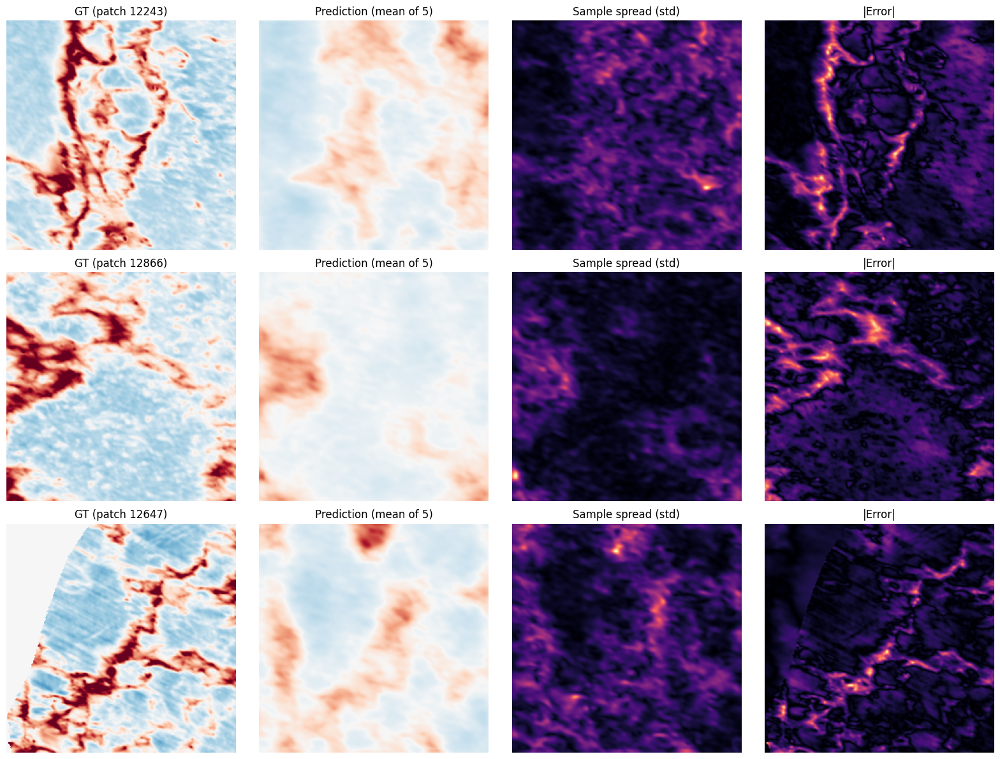

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_tuk_pcrtc_realattrs_spatialsplit_standardised_plms_uncertainty_map.png


In [15]:
N_CAL, N_SAMPLES = 40, 5
cal_idx = random.Random(SEED + 7).sample(range(len(val_dataset)), N_CAL)
spreads, errors, examples = [], [], []
with torch.no_grad():
    for j, idx in enumerate(cal_idx):
        item = val_dataset[idx]
        target = item['lidar'].unsqueeze(0).to(DEVICE); cond = item['s1'].unsqueeze(0).to(DEVICE)
        attrs = item['attrs'].unsqueeze(0).to(DEVICE); mask = item['mask'].to(DEVICE).bool()
        samples = torch.stack([sampler(model, scheduler, target.shape, cond, attrs, DEVICE)[0, 0] for _ in range(N_SAMPLES)])
        spread = samples.std(0); err = (samples.mean(0) - target[0, 0]).abs()
        spreads.append(spread[mask].cpu().numpy()); errors.append(err[mask].cpu().numpy())
        if len(examples) < 3:
            examples.append({'pid': item['patch_id'], 'gt': target[0, 0].cpu().numpy(), 'pred': samples.mean(0).cpu().numpy(),
                             'spread': spread.cpu().numpy(), 'err': err.cpu().numpy(), 'mask': mask.cpu().numpy()})
        if (j + 1) % 10 == 0: print(f'  {j+1}/{N_CAL}')
r = float(np.corrcoef(np.concatenate(spreads), np.concatenate(errors))[0, 1])
print(f'pixel-level correlation between sample spread and |error|: {r:.4f}  (dB/DDIM in-region: 0.4079)')
json.dump({'checkpoint': CKPT_PATH.name, 'sampler': 'plms', 'n_patches': N_CAL, 'n_samples': N_SAMPLES, 'spread_error_corr': r},
          open(OUTPUT_DIR / f's1_{FIG_TAG}_uncertainty_calibration.json', 'w'), indent=2)

fig, axes = plt.subplots(len(examples), 4, figsize=(16, 4 * len(examples)), squeeze=False)
for row, ex in enumerate(examples):
    g = ex['gt'] - ex['gt'][ex['mask']].mean(); p = ex['pred'] - ex['pred'][ex['mask']].mean()
    v = np.quantile(np.abs(np.concatenate([g.ravel(), p.ravel()])), 0.99)
    for ax, im, title, kw in zip(axes[row], [g, p, ex['spread'], ex['err']],
                                 [f'GT (patch {ex["pid"]})', 'Prediction (mean of 5)', 'Sample spread (std)', '|Error|'],
                                 [dict(cmap='RdBu_r', vmin=-v, vmax=v), dict(cmap='RdBu_r', vmin=-v, vmax=v), dict(cmap='magma'), dict(cmap='magma')]):
        ax.imshow(im, **kw); ax.set_title(title); ax.axis('off')
plt.tight_layout()
out_path = OUTPUT_DIR / f's1_tuk_{FIG_TAG}_uncertainty_map.png'
plt.savefig(out_path, dpi=150, bbox_inches='tight'); plt.show(); print('Saved:', out_path)

## Files produced

* `s1_pcrtc_realattrs_spatialsplit_standardised_plms_validation_metrics.json`
* `..._gt_pred_std_scatter.png`, `..._reconstructions_pdfs.png`, `..._metric_violin_plots.png`, `..._success_failure.png`
* `s1_tuk_pcrtc_realattrs_spatialsplit_standardised_plms_uncertainty_map.png`, `..._uncertainty_calibration.json`

`scp` the PNGs to `latex/figures/` and the `\figmaybe` names in Chapter 4 switch to these.

## 8. Confidence map: where the model is sure, and whether it is right there

Same 40 patches and 5 samples as Section 7 (recomputed if the kernel was
restarted). Two outputs:

1. **Decile table** -- pixels from all 40 patches binned by sample spread;
   mean |error| per decile. The ratio of the top to the bottom decile is the
   plain-language calibration number ("the pixels the model is least sure
   about carry N times the error").
2. **Confidence figure** -- for three patches: GT, prediction, a confidence
   map (low spread = high confidence) with the most-confident quartile
   outlined, and |error| with the same outline, so the reader can see
   whether the confident region is also the low-error region.


  10/40
  20/40
  30/40
  40/40
spread decile -> mean |error| (m)
  D1  spread 0.0005-0.0168   MAE 0.0626
  D2  spread 0.0168-0.0228   MAE 0.0683
  D3  spread 0.0228-0.0288   MAE 0.0762
  D4  spread 0.0288-0.0360   MAE 0.0853
  D5  spread 0.0360-0.0452   MAE 0.0979
  D6  spread 0.0452-0.0568   MAE 0.1157
  D7  spread 0.0568-0.0709   MAE 0.1340
  D8  spread 0.0709-0.0883   MAE 0.1499
  D9  spread 0.0883-0.1132   MAE 0.1659
  D10 spread 0.1132-0.4968   MAE 0.1876
top / bottom decile MAE ratio: 3.00
MAE in most-confident quartile (spread < 0.0257): 0.0672 m
MAE in least-confident quartile (spread > 0.0790): 0.1720 m


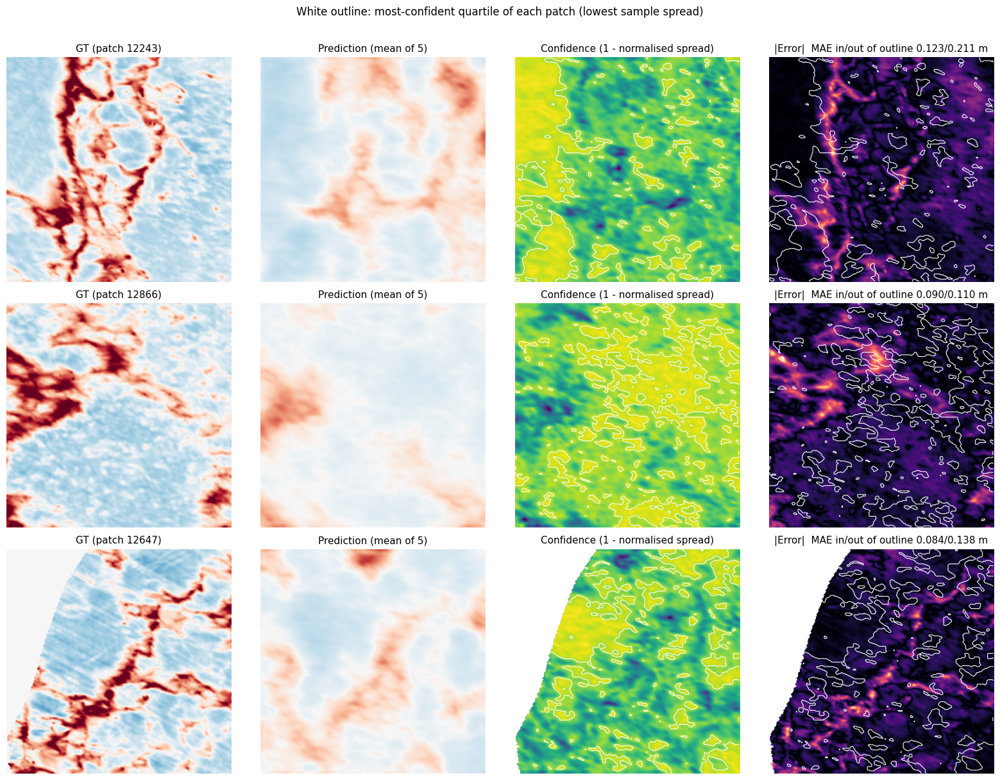

Saved: /cs/student/project_msc/2025/aibh/jiayiche/s1_training_outputs/s1_tuk_pcrtc_realattrs_spatialsplit_standardised_plms_confidence_map.png


In [24]:
import matplotlib.pyplot as plt
import random
sampler = p_sample_loop_plms

# --- recompute the 40 x 5 sampling if Section 7 did not run in this kernel ---
if 'spreads' not in globals() or 'examples' not in globals():
    N_CAL, N_SAMPLES = 40, 5
    cal_idx = random.Random(SEED + 7).sample(range(len(val_dataset)), N_CAL)
    spreads, errors, examples = [], [], []
    with torch.no_grad():
        for j, idx in enumerate(cal_idx):
            item = val_dataset[idx]
            target = item['lidar'].unsqueeze(0).to(DEVICE); cond = item['s1'].unsqueeze(0).to(DEVICE)
            attrs = item['attrs'].unsqueeze(0).to(DEVICE); mask = item['mask'].to(DEVICE).bool()
            samples = torch.stack([sampler(model, scheduler, target.shape, cond, attrs, DEVICE)[0, 0] for _ in range(N_SAMPLES)])
            spread = samples.std(0); err = (samples.mean(0) - target[0, 0]).abs()
            spreads.append(spread[mask].cpu().numpy()); errors.append(err[mask].cpu().numpy())
            if len(examples) < 3:
                examples.append({'pid': item['patch_id'], 'gt': target[0, 0].cpu().numpy(), 'pred': samples.mean(0).cpu().numpy(),
                                 'spread': spread.cpu().numpy(), 'err': err.cpu().numpy(), 'mask': mask.cpu().numpy()})
            if (j + 1) % 10 == 0: print(f'  {j+1}/{N_CAL}')

# --- 1. decile table over all valid pixels of the 40 patches ---
S = np.concatenate(spreads); E = np.concatenate(errors)
edges = np.quantile(S, np.linspace(0, 1, 11))
dec = np.clip(np.searchsorted(edges, S, side='right') - 1, 0, 9)
mae_by_decile = np.array([E[dec == k].mean() for k in range(10)])
ratio = mae_by_decile[9] / mae_by_decile[0]
print('spread decile -> mean |error| (m)')
for k in range(10): print(f'  D{k+1:<2d} spread {edges[k]:.4f}-{edges[k+1]:.4f}   MAE {mae_by_decile[k]:.4f}')
print(f'top / bottom decile MAE ratio: {ratio:.2f}')
q25 = np.quantile(S, 0.25); q75 = np.quantile(S, 0.75)
print(f'MAE in most-confident quartile (spread < {q25:.4f}): {E[S < q25].mean():.4f} m')
print(f'MAE in least-confident quartile (spread > {q75:.4f}): {E[S > q75].mean():.4f} m')
json.dump({'checkpoint': CKPT_PATH.name, 'sampler': 'plms', 'n_patches': len(spreads), 'n_samples': 5,
           'decile_edges': edges.tolist(), 'mae_by_decile': mae_by_decile.tolist(), 'top_bottom_ratio': float(ratio),
           'mae_confident_quartile': float(E[S < q25].mean()), 'mae_unconfident_quartile': float(E[S > q75].mean())},
          open(OUTPUT_DIR / f's1_{FIG_TAG}_confidence_deciles.json', 'w'), indent=2)

# --- 2. confidence figure: confident quartile outlined on both confidence and error ---
fig, axes = plt.subplots(len(examples), 4, figsize=(16, 4 * len(examples)), squeeze=False)
for row, ex in enumerate(examples):
    m = ex['mask']
    g = ex['gt'] - ex['gt'][m].mean(); p = ex['pred'] - ex['pred'][m].mean()
    v = np.quantile(np.abs(np.concatenate([g[m].ravel(), p[m].ravel()])), 0.99)
    sp = ex['spread']; conf = np.where(m, 1.0 - (sp - sp[m].min()) / (sp[m].max() - sp[m].min() + 1e-9), np.nan)
    confident = (sp <= np.quantile(sp[m], 0.25)) & m
    err = np.where(m, ex['err'], np.nan)
    mae_in = ex['err'][confident].mean(); mae_out = ex['err'][m & ~confident].mean()
    panels = [(g, f'GT (patch {ex["pid"]})', dict(cmap='RdBu_r', vmin=-v, vmax=v)),
              (p, 'Prediction (mean of 5)', dict(cmap='RdBu_r', vmin=-v, vmax=v)),
              (conf, 'Confidence (1 - normalised spread)', dict(cmap='viridis', vmin=0, vmax=1)),
              (err, f'|Error|  MAE in/out of outline {mae_in:.3f}/{mae_out:.3f} m', dict(cmap='magma'))]
    for ax, (im, title, kw) in zip(axes[row], panels):
        ax.imshow(im, **kw); ax.set_title(title, fontsize=11); ax.axis('off')
    for ax in axes[row][2:]:
        ax.contour(confident.astype(float), levels=[0.5], colors='white', linewidths=0.8)
plt.suptitle('White outline: most-confident quartile of each patch (lowest sample spread)', y=1.01)
plt.tight_layout()
out_path = OUTPUT_DIR / f's1_tuk_{FIG_TAG}_confidence_map.png'
plt.savefig(out_path, dpi=150, bbox_inches='tight'); plt.show(); print('Saved:', out_path)
